In [1]:
import sys
sys.path.append("/Users/jameskitchens/Documents/GitHub/terracotta")
import terracotta as tct
import pandas as pd
import tskit
import matplotlib.pyplot as plt
from glob import glob
import plotly.express as px

In [2]:
demes = pd.read_csv("datasets/one_sample_per_deme/demes.tsv", sep="\t")
samples = pd.read_csv("datasets/one_sample_per_deme/samples.tsv", sep="\t")
world_map = tct.WorldMap(demes, samples)

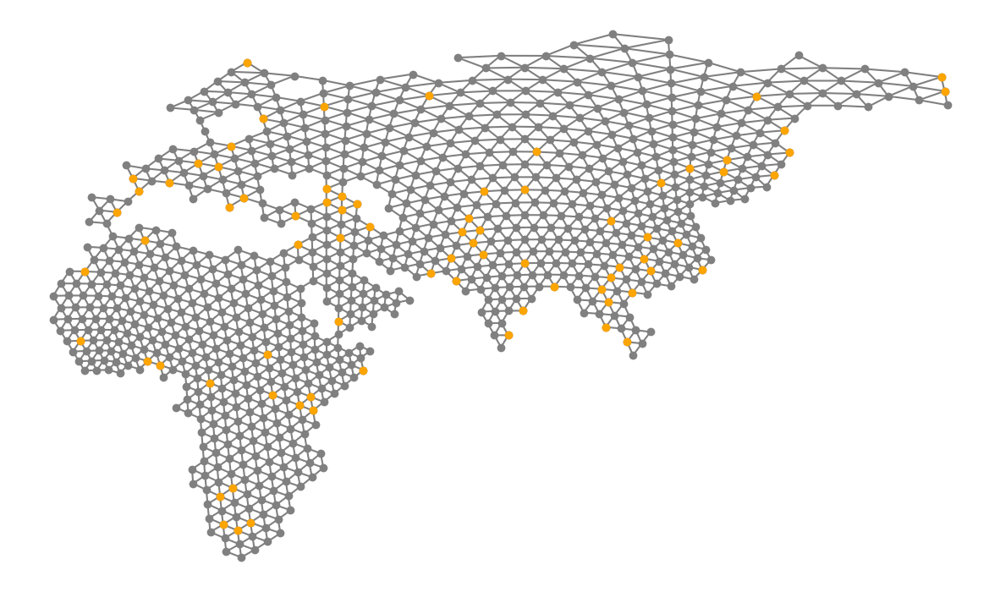

In [3]:
world_map.draw(figsize=(15,15), show_samples=True)

In [4]:
px.scatter(x=demes["xcoord"], y=demes["ycoord"], hover_data=[demes["id"]])
#px.scatter(x=demes.loc[demes["id"]==109, "xcoord"], y=demes.loc[demes["id"]==109, "ycoord"])

In [5]:
def ancestors(tree, u):
    """Find all of the ancestors above a node for a tree

    Taken directly from https://github.com/tskit-dev/tskit/issues/2706

    Parameters
    ----------
    tree : tskit.Tree
    u : int
        The ID for the node of interest

    Returns
    -------
    An iterator over the ancestors of u in this tree
    """

    u = tree.parent(u)
    while u != -1:
         yield u
         u = tree.parent(u)

tree = tskit.load("datasets/one_sample_per_deme/m1e-05/rep0/trees/0.trees")
tree_tree = tree.first()
sample = 0
lineage = ancestors(tree_tree, sample)

109

In [13]:
pop_order = [int(tree.population(tree.node(sample).population).metadata["name"].split("_")[1])]
times = [int(tree.node(sample).time)]
for ancestor in lineage:
    pop_order.append(int(tree.population(tree.node(ancestor).population).metadata["name"].split("_")[1]))
    times.append(int(tree.node(ancestor).time))

In [17]:
xs = []
ys = []
ts = []
sizes = []
count_of_pops = {}
for pop in pop_order:
    coords = demes.loc[demes.id==pop, :]
    if len(coords) != 1:
        print(pop)
    xs.append(coords["xcoord"])
    ys.append(coords["ycoord"])
    count = count_of_pops.get(pop, 0)
    sizes.append(max(150-(10*count), 10))
    count_of_pops[pop] = count + 1

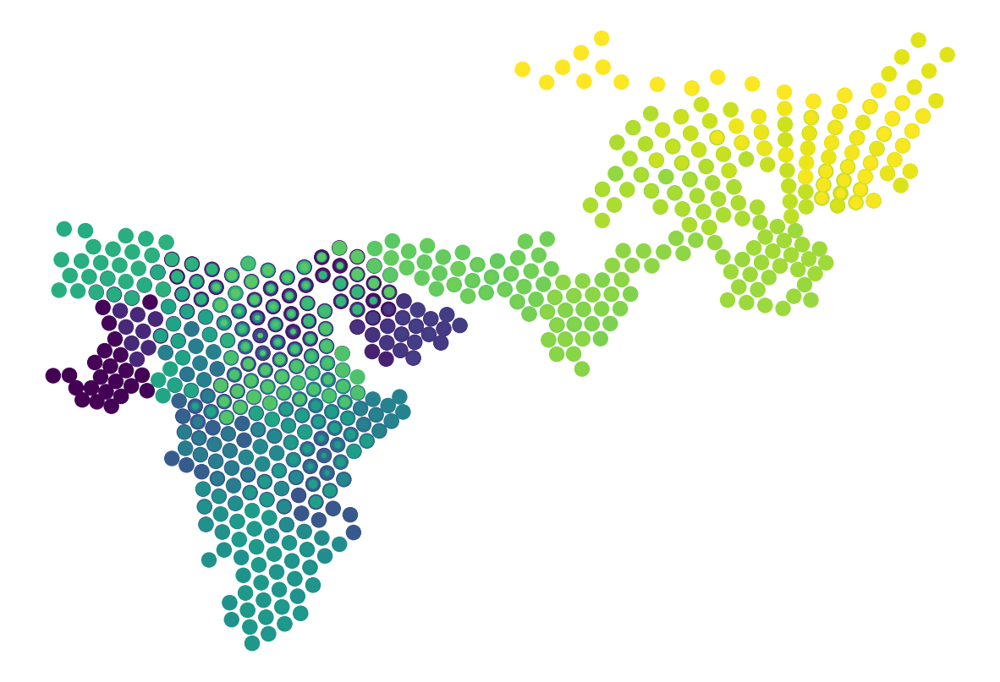

In [18]:
plt.figure(figsize=(15,15))
plt.scatter(xs, ys, c=times, s=sizes)
plt.gca().set_aspect("equal")
plt.axis("off")
plt.show()

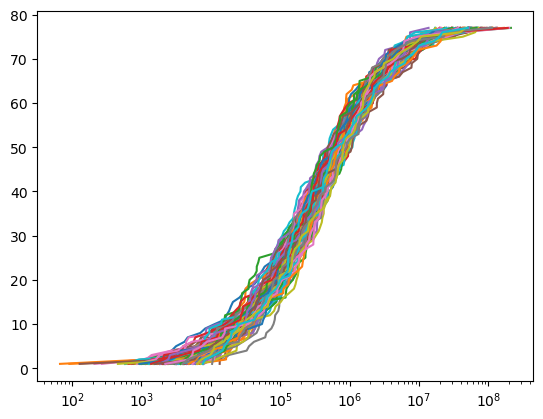

In [30]:
trees = [tskit.load(ts).simplify().first() for ts in glob(f"datasets/one_sample_per_deme/m1e-05/rep0/trees/*")]
for tree in trees:
    times = []
    cumlative = []
    counter = 0
    for node in tree.nodes(order="timeasc"):
        if not tree.is_sample(node):
            times.append(tree.time(node))
            counter += 1
            cumlative.append(counter)
    plt.plot(times, cumlative)
plt.xscale("log")
plt.show()

In [19]:
trees = [tskit.load(ts).simplify() for ts in glob(f"datasets/diploid_one_sample_per_deme/m1e-05/rep0/trees/*")]
for tree in trees:
    times = []
    cumlative = []
    counter = 0
    for node in tree.nodes(order="timeasc"):
        if not tree.is_sample(node):
            times.append(tree.time(node))
            counter += 1
            cumlative.append(counter)
    plt.plot(times, cumlative)
plt.xscale("log")
plt.show()

AttributeError: 'TreeSequence' object has no attribute 'is_sample'

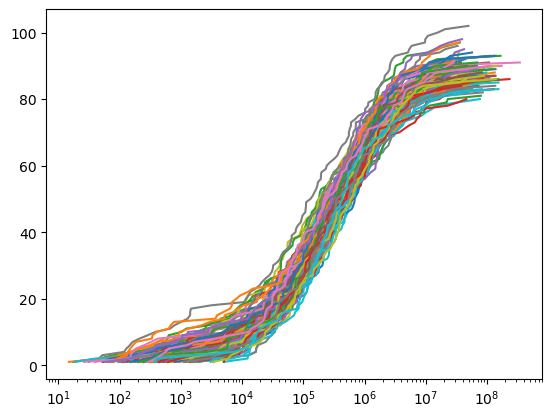

In [13]:
tss = [tskit.load(ts).simplify() for ts in glob(f"datasets/all_samples/m1e-05/rep0/trees/*")]
for ts in tss:
    tree = ts.first()
    times = []
    cumlative = []
    counter = 0
    for node in tree.nodes(order="timeasc"):
        if not tree.is_sample(node):
            pops_check = False
            pop = -1
            for leaf in tree.leaves(node):
                if pop == -1:
                    pop = ts.node(leaf).population
                else:
                    if ts.node(leaf).population != pop:
                        pops_check = True
                        break
            if pops_check:
                times.append(tree.time(node))
                counter += 1
                cumlative.append(counter)
    plt.plot(times, cumlative)
plt.xscale("log")
plt.show()

In [20]:
tree0 = tskit.load("trees/0.trees").simplify()
print(tree0.tables.nodes)
tree1 = tskit.load("trees/1.trees").simplify()
print(tree1.tables.nodes)

╔═════╤═════╤══════════╤══════════╤═══════════════════╤════════╗
║id   │flags│population│individual│time               │metadata║
╠═════╪═════╪══════════╪══════════╪═══════════════════╪════════╣
║0    │    1│        17│         0│         0.00000000│        ║
║1    │    1│        17│         1│         0.00000000│        ║
║2    │    1│        65│         2│         0.00000000│        ║
║3    │    1│        65│         3│         0.00000000│        ║
║4    │    1│        84│         4│         0.00000000│        ║
║5    │    1│        84│         5│         0.00000000│        ║
║6    │    1│       132│         6│         0.00000000│        ║
║7    │    1│       132│         7│         0.00000000│        ║
║8    │    1│        84│         8│         0.00000000│        ║
║9    │    1│        84│         9│         0.00000000│        ║
║10   │    1│        74│        10│         0.00000000│        ║
║11   │    1│        74│        11│         0.00000000│        ║
║12   │    1│        93│ 

In [17]:
tss = [tskit.load(ts).simplify(filter_populations=False) for ts in glob(f"datasets/all_samples/m1e-05/rep0/trees/*")]

In [18]:
print(tss[0].tables.nodes)

╔═════╤═════╤══════════╤══════════╤═══════════════════╤════════╗
║id   │flags│population│individual│time               │metadata║
╠═════╪═════╪══════════╪══════════╪═══════════════════╪════════╣
║0    │    1│       107│         0│         0.00000000│        ║
║1    │    1│       107│         1│         0.00000000│        ║
║2    │    1│       107│         2│         0.00000000│        ║
║3    │    1│       107│         3│         0.00000000│        ║
║4    │    1│       107│         4│         0.00000000│        ║
║5    │    1│       107│         5│         0.00000000│        ║
║6    │    1│       107│         6│         0.00000000│        ║
║7    │    1│       107│         7│         0.00000000│        ║
║8    │    1│       107│         8│         0.00000000│        ║
║9    │    1│       107│         9│         0.00000000│        ║
║10   │    1│       107│        10│         0.00000000│        ║
║11   │    1│       107│        11│         0.00000000│        ║
║12   │    1│       107│ 